In [28]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html


In [29]:
!pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-x7p8fcm0
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-x7p8fcm0


In [30]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

import numpy as np
import os,json,cv2,random
from google.colab.patches import cv2_imshow

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("teeth3", {}, "/content/output.json", "/content/train")

In [31]:
sample_metadata = MetadataCatalog.get("teeth3")
dataset_dicts = DatasetCatalog.get("teeth3")

WARNING [04/08 04:42:01 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/08 04:42:01 d2.data.datasets.coco]: Loaded 22 images in COCO format from /content/output.json


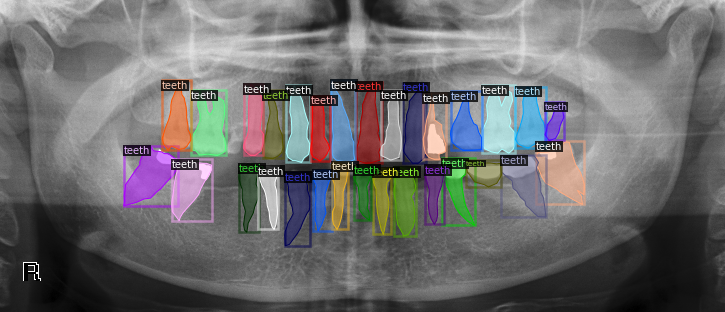

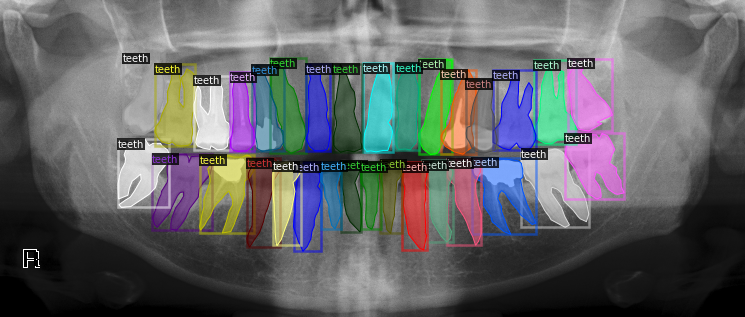

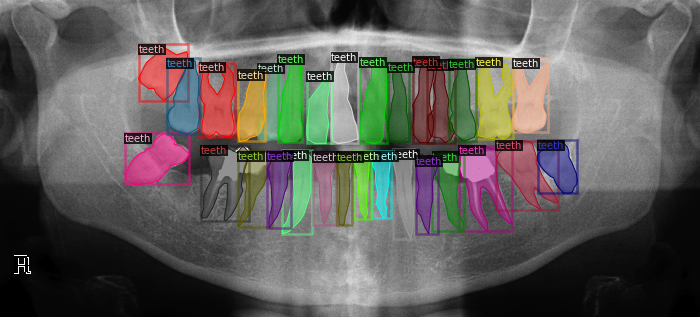

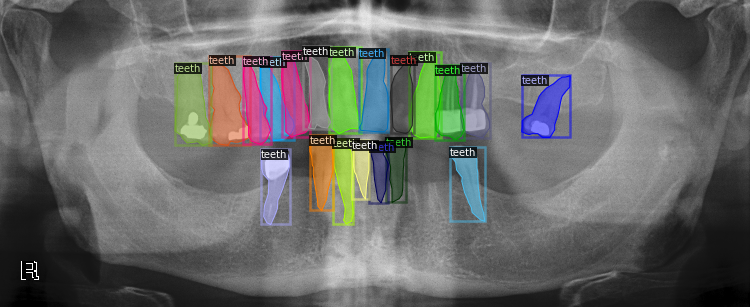

In [32]:
import random

for d in random.sample(dataset_dicts, 4):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=sample_metadata, scale=0.25)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [33]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("teeth3",)
cfg.DATASETS.TEST = ()   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")# initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.02
cfg.SOLVER.MAX_ITER = 200   # 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # 3 classes (Person, Helmet, Car)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[04/08 04:42:12 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, we

[04/08 04:42:13 d2.engine.train_loop]: Starting training from iteration 0
[04/08 04:42:38 d2.utils.events]:  eta: 0:03:42  iter: 19  total_loss: 1.611  loss_cls: 0.5108  loss_box_reg: 0.76  loss_rpn_cls: 0.1347  loss_rpn_loc: 0.1575  time: 1.2458  data_time: 0.0388  lr: 0.0019181  max_mem: 2451M
[04/08 04:43:03 d2.utils.events]:  eta: 0:03:18  iter: 39  total_loss: 1.017  loss_cls: 0.2613  loss_box_reg: 0.5463  loss_rpn_cls: 0.0204  loss_rpn_loc: 0.1331  time: 1.2519  data_time: 0.0115  lr: 0.0039161  max_mem: 2451M
[04/08 04:43:29 d2.utils.events]:  eta: 0:02:54  iter: 59  total_loss: 0.7273  loss_cls: 0.2214  loss_box_reg: 0.3817  loss_rpn_cls: 0.01117  loss_rpn_loc: 0.1212  time: 1.2545  data_time: 0.0102  lr: 0.0059141  max_mem: 2451M
[04/08 04:43:54 d2.utils.events]:  eta: 0:02:29  iter: 79  total_loss: 0.6671  loss_cls: 0.1938  loss_box_reg: 0.3616  loss_rpn_cls: 0.006862  loss_rpn_loc: 0.1166  time: 1.2563  data_time: 0.0126  lr: 0.0079121  max_mem: 2451M
[04/08 04:44:19 d2.util

In [36]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("teeth3",)
predictor = DefaultPredictor(cfg)

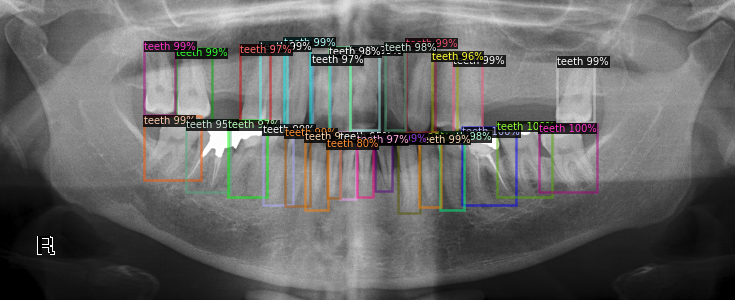

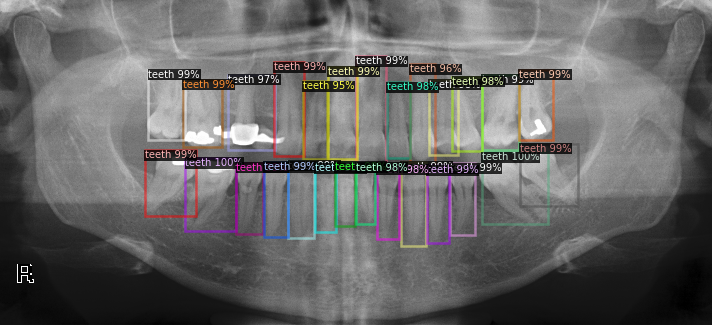

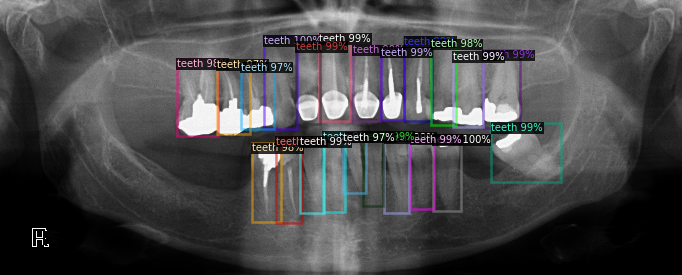

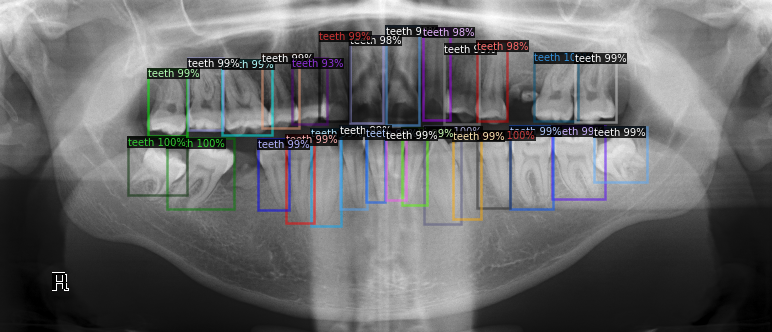

In [37]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(dataset_dicts, 4):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=sample_metadata, 
                   scale=0.25, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

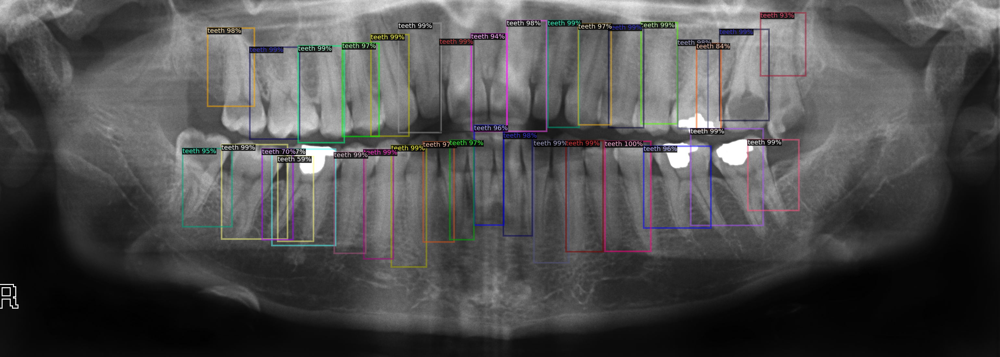

In [68]:
image = cv2.imread("/content/testing/78.png")
viz = Visualizer(image[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0])) #images are loaded by opencv in BGR format and hence need to be converted to RGB
output = viz.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(output.get_image()[:,:,::-1])

In [74]:
def show_image(imm):

  image = cv2.imread(imm)
  predictor = DefaultPredictor(cfg)
  outputs = predictor(image)
  viz = Visualizer(image[:,:,::-1], 
                   MetadataCatalog.get(cfg.DATASETS.TRAIN[0]),
                   scale=0.25) #images are loaded by opencv in BGR format and hence need to be converted to RGB
  output = viz.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(output.get_image()[:,:,::-1])#Converted back to BGR

In [75]:
import numpy as np

list_images = os.listdir('/content/testing')
arr_images = np.asarray(list_images)

/content/testing/85.png


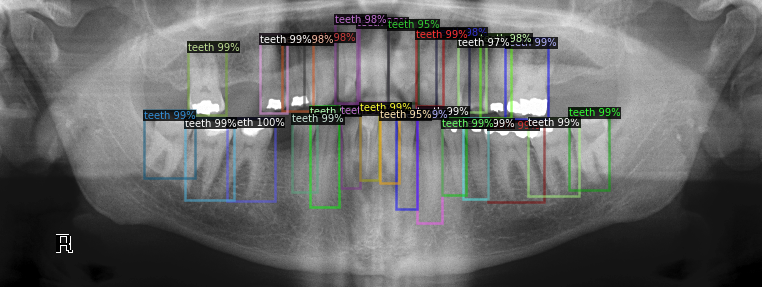

/content/testing/81.png


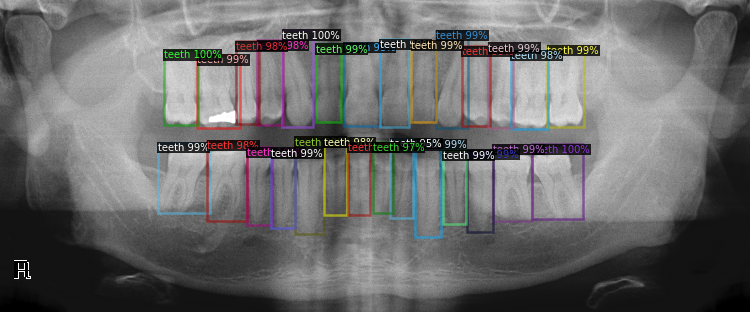

/content/testing/91.png


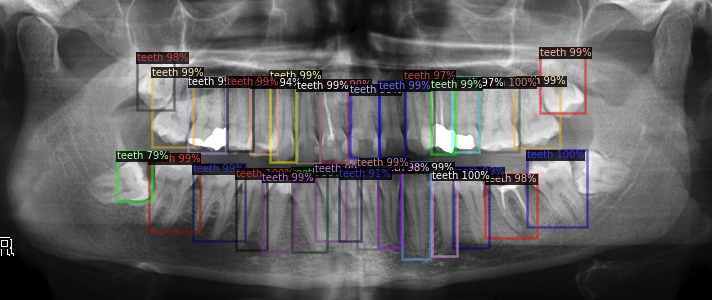

/content/testing/79.png


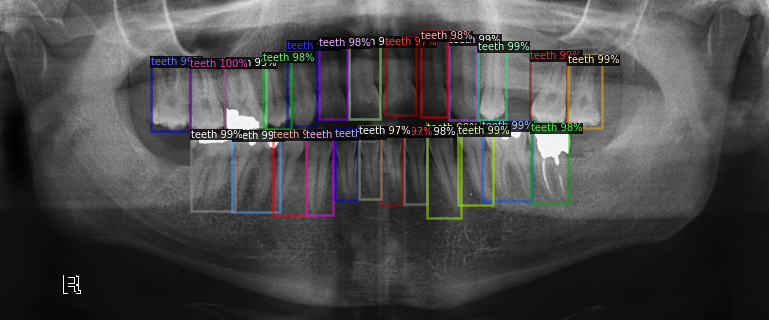

/content/testing/78.png


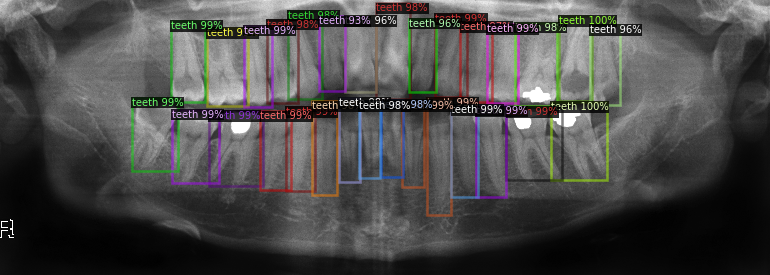

/content/testing/80.png


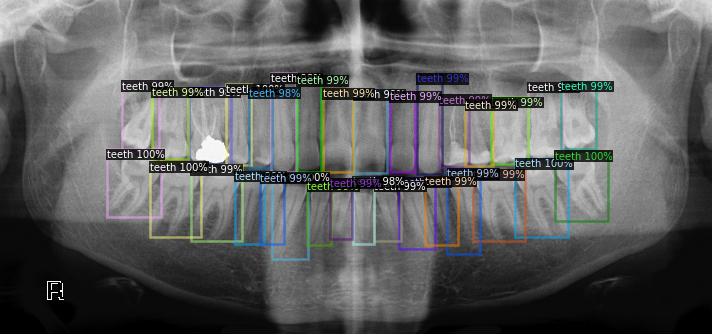

/content/testing/90.png


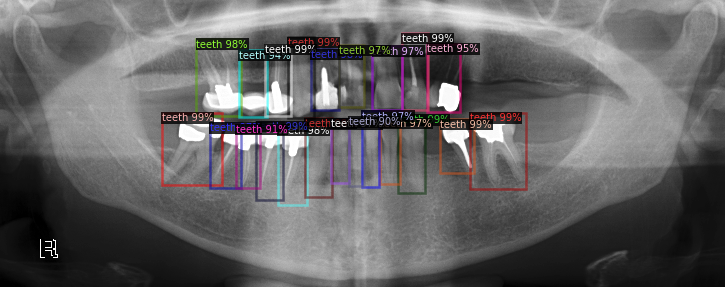

/content/testing/86.png


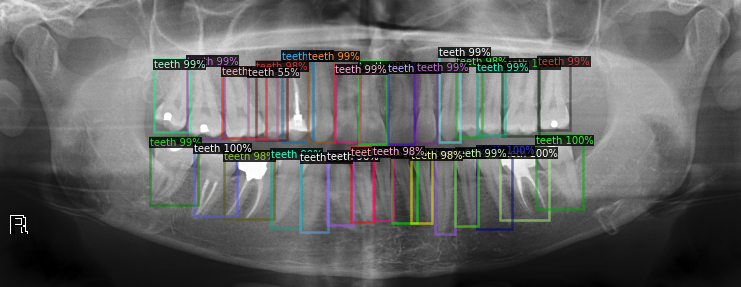

/content/testing/83.png


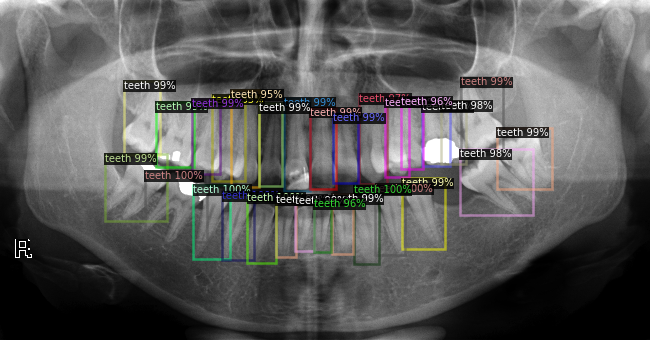

/content/testing/92.png


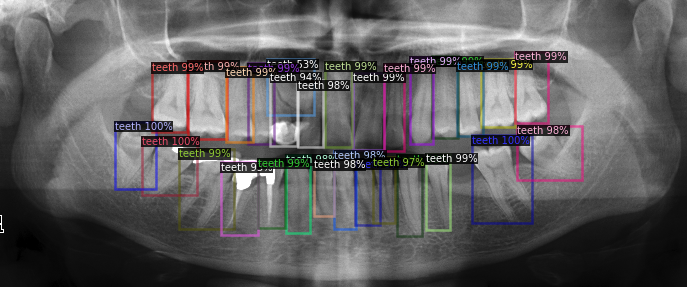

/content/testing/88.png


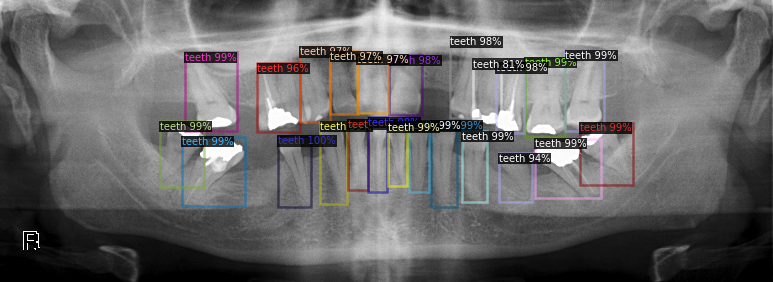

/content/testing/82.png


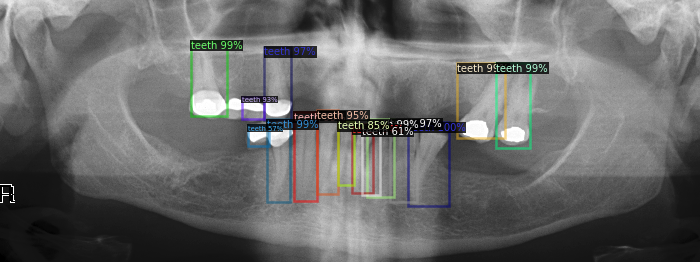

/content/testing/89.png


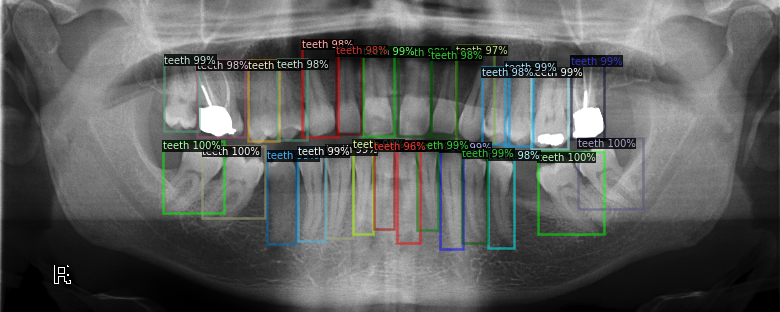

/content/testing/84.png


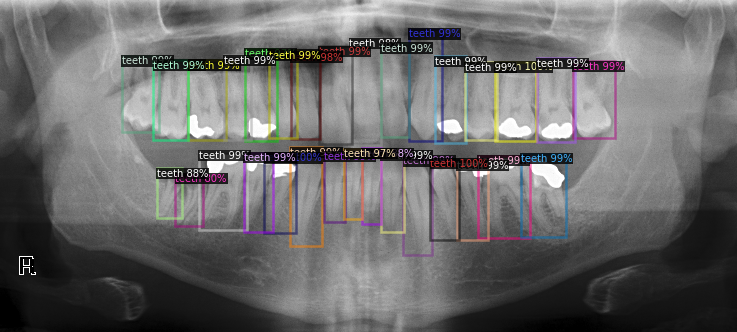

/content/testing/93.png


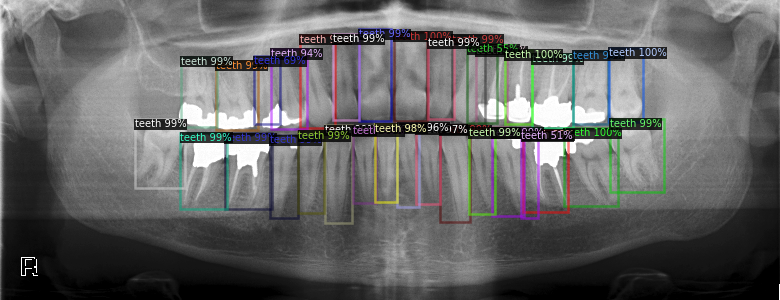

/content/testing/87.png


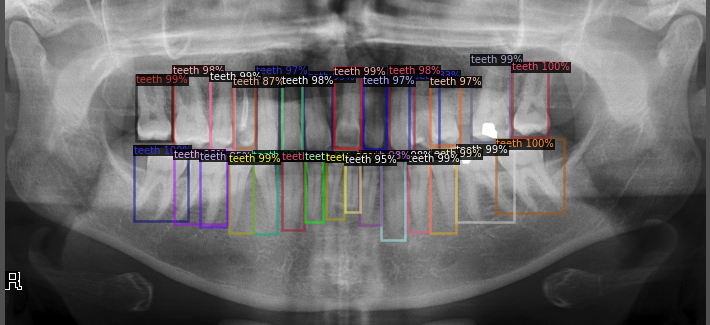

In [76]:
base_path = '/content/testing/'

for i in range(len(arr_images)):

  image_path = os.path.join(base_path,list_images[i])
  print(image_path)
  show_image(image_path)